In [1]:
from IPython.display import HTML

In [71]:
import random
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.autograd import Variable
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

import logging
handler=logging.basicConfig(level=logging.INFO)
lgr = logging.getLogger(__name__)

#Utilisation des GPUs
#use_cuda = torch.cuda.is_available()
use_cuda = False

torch.manual_seed(0)

FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
Tensor = FloatTensor

from sklearn import preprocessing
import sklearn.metrics
import sklearn.metrics.pairwise
import matplotlib.pyplot as plt
def recurrence_plot(s, eps=None, steps=None):
    if eps==None: eps=0.1
    if steps==None: steps=10
    d = sklearn.metrics.pairwise.pairwise_distances(s)
    d = np.floor(d / eps)
    d[d > steps] = steps
    return d

In [96]:
%%html
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
Le code Python est caché pour une lecture plus facile. Pour l'afficher cliquez  <a href="javascript:code_toggle()">ici</a>

L'objectif de ce notebook est de détecter les anomalies dans des séries temporelles transformées en images à l'aide d'un auto-encodeur convolutif. Si vous ne connaissez pas le principe de l'auto-encodeur ou son utilisation sur les séries temporelles, je vous invite à aller voir le notebook : AD With Simple AE

## Sommaire
1. [Transformons notre problème en un problème d'image](#Image)
2. [L'auto-encodeur convolutif](#CAE)
3. [Application d'un autoencodeur convolutif sur des représentations graphiques de séries complexes](#recurrence_plot)
4. [Conclusion](#Conclusion)

# Transformons notre problème en un problème d'image <a name="Image"></a>

Essayons de transformer cette série temporelle afin de pouvoir créer une "texture" représentant les patterns.

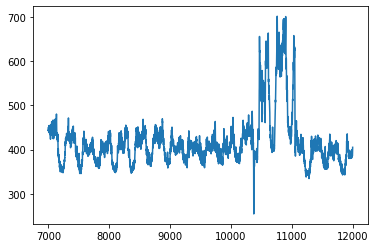

In [4]:
df= pd.read_json('Data/serie2.json', lines=True)[['val']][7000:12000]
plt.plot(df)

Nous commençons par normaliser la donnée 

In [5]:
x = df.values 
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_normalize = pd.DataFrame(x_scaled)

Pour générer les données d'entraînement, on va appliquer sur la série une fenêtre glissante d'une taille limitée mais permettant quand même de capter les caractéristiques de la série.

**En pratique la taille de la fenêtre glissante est égale à la taille minimale d'un pattern.**

Prenons une taille de fenêtre de 2000 et un pas de 25

In [6]:
n = 2000 
k = 25
list_df = np.array([df_normalize[i:i+n].values.tolist() for i in range(0,df_normalize.shape[0]-n,k)] ,  dtype=np.float64)

En prenant l'écart absolu de chaque paires de valeurs de la série temporelle, nous obtenons une répresenation 2D de celle-ci. (Cette technique est appelé "Recurrence plot") 

Ps : Plus la valeur est grande , plus la couleur est claire. L'"image" obtenu est biensur une symétrie puisque la différence entre un point x1 et x2 est équivalente à la différence entre le point x2 et x1.

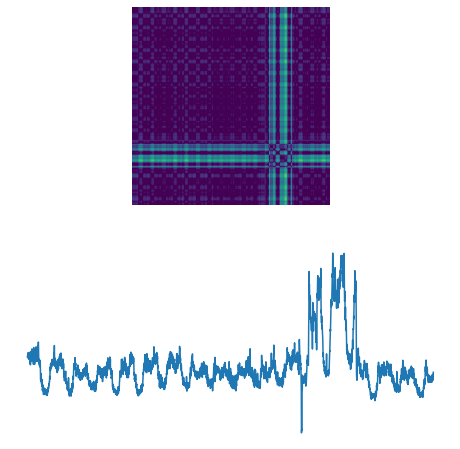

In [7]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df_normalize))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df_normalize)

Voici une série temporelle et l'image la représentante

## Changement de plusieurs Time-Series en image

Essayons sur différentes séries temporelles pour observer si nous pouvons facilement détecter des changements de pattern.

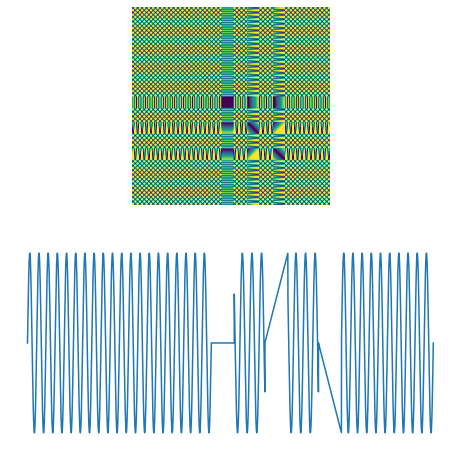

In [8]:
nb_periods=10
nb_points=2600
x = np.linspace(-nb_periods*np.pi, nb_periods*np.pi, nb_points)
x2 = np.linspace(int(-nb_periods*np.pi/3), int(nb_periods*np.pi/3), int(nb_points/3))
aa=list(np.sin(x))
bb=list(np.zeros(int(nb_points/4)))
cc=list(np.sin(x2))
dd=list(np.arange(int(nb_points/4))/int(nb_points/-4))
ee=list(np.arange(int(nb_points/4))/int(nb_points/4))

s = np.array(aa+aa+bb+cc+ee+cc+dd+aa)
df = pd.DataFrame(s)
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.imshow(recurrence_plot(df))
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df)

Observons cela sur une fenêtre de temps 

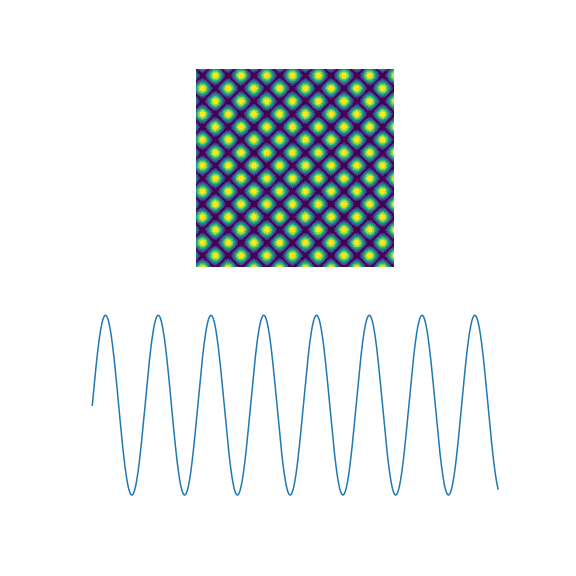

In [9]:
from IPython.display import Image
Image(filename="Data/courbe2.gif")

Cette façon de visualiser les séries temporelles est intéressante car nous savons déjà que les réseaux de neurones convolutifs sur les images sont extrémement fort pour détecter les "textures" et c'est exactement ce en quoi nous transformons nos time-series.

# L'autoencodeur convolutif <a name="CAE"></a>

L'autoencodeur convolutif est un autoencodeur avec des couches convolutives. Les réseaux de neurones convolutifs visent à limiter le nombre d'entrées tout en conservant la forte corrélation « spatialement locale » des images.
Une architecture de réseau de neurones convolutifs est formée par un empilement de couches de traitement :
* la couche de convolution (CONV) qui traite les données d'un champ récepteur 
* la couche de pooling (POOL), qui permet de compresser l'information en réduisant la taille de l'image intermédiaire (souvent par sous-échantillonnage) 

Pour un autoencodeur nous aurons également des couches de déconvolution pour remonter progressivement vers la résolution de départ. 

### La couche de convolution

Ensemble de neurones (cercles) créant la profondeur d'une couche de convolution (bleu). Ils sont liés à un même champ récepteur (rouge).

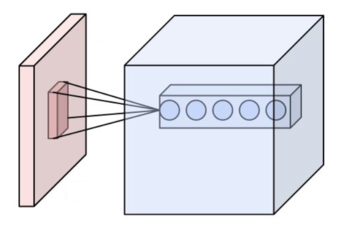

In [10]:
Image(filename="Data/Conv_layer.png")

### La couche de pooling

Max pooling avec un filtre 2 × 2 et un pas de 2.

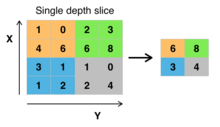

In [11]:
Image(filename="Data/Max_pooling.png")

# Application d'un autoencodeur convolutif sur des représentations graphiques de séries complexes <a name="recurrence_plot"></a>

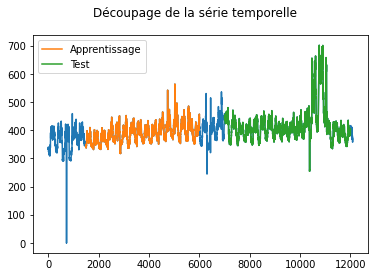

In [12]:
df_total= pd.read_json('Data/serie2.json', lines=True)[['val']]
plt.plot(df_total)

df= pd.read_json('Data/serie2.json', lines=True)[['val']][1500:6000]
plt.plot(df,label="Apprentissage")

df_test= pd.read_json('Data/serie2.json', lines=True)[['val']][7000:12000]
plt.plot(df_test,label="Test")

plt.legend()
plt.suptitle("Découpage de la série temporelle")
plt.show()

On normalise 

In [13]:
df_total = df_total.iloc[1:].dropna()
x = df_total.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_normalize = pd.DataFrame(x_scaled)

On découpe en fenêtre de temps de taille 900 et de pas 5. 

In [14]:
n = 900
k = 5
list_df = np.array([df_normalize[i:i+n].values.tolist() for i in range(0,df_normalize.shape[0]-n,k)] ,  dtype=np.float64)

Transformons nos fenêtres en image 

In [ ]:
import sklearn.metrics

filenames = []

j=0
for i in list_df: 
    j+=1
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(1, 1, 1)
    ax.axis('off')
    ax.imshow(recurrence_plot(i))
    fig.savefig('Data/img/img_'+str(j)+'.png')   # save the figure to file
    filenames.append('Data/img/img_'+str(j)+'.png')
    plt.close(fig)


Notre série temporelle transformée

In [97]:
Image(filename="Data/img.gif")

Sélectionnons les images pour l'entrainement

In [21]:
from skimage.io import imread 
from skimage.transform import resize
from tqdm import tqdm

train_img = []
for img_name in tqdm(range(100,700)):
    # defining the image path
    image_path = 'Data/img/img_'+ str(img_name) + '.png'
    # reading the image
    img = imread(image_path, as_gray=True)
    img = resize(img, (216, 224))
    # converting the type of pixel to float 32
    img = img.astype('float32')
    # normalizing the pixel values
    img /= 255.0
    # appending the image into the list
    train_img.append(img)

# converting the list to numpy array
train_x = np.array(train_img)

train_x.shape

100%|██████████| 600/600 [00:16<00:00, 36.54it/s]


(600, 216, 224)

Sélectionnons les images pour le test

In [23]:
test_img = []
for img_name in tqdm(range(list_df.shape[0]-1000,list_df.shape[0])):
    # defining the image path
    image_path = 'Data/img/img_'+ str(img_name) + '.png'
    # reading the image
    img = imread(image_path, as_gray=True)
    img = resize(img, (216, 224))
    # converting the type of pixel to float 32
    img = img.astype('float32')
    # normalizing the pixel values
    img /= 255.0
    # appending the image into the list
    test_img.append(img)

# converting the list to numpy array
test_x = np.array(test_img)

test_x.shape

100%|██████████| 1000/1000 [00:27<00:00, 36.17it/s]


(1000, 216, 224)

Exemple d'images : 

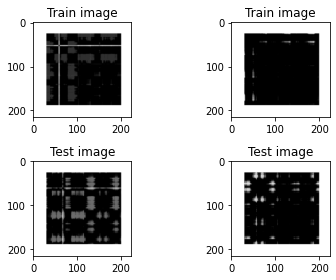

In [24]:
fig, axes = plt.subplots(nrows=2, ncols=2)

ax = axes.ravel()

ax[0].imshow(train_img[15], cmap='gray')
ax[0].set_title("Train image")

ax[1].imshow(train_img[150], cmap='gray')
ax[1].set_title("Train image")

ax[2].imshow(test_img[100], cmap='gray')
ax[2].set_title("Test image")

ax[3].imshow(test_img[200], cmap='gray')
ax[3].set_title("Test image")


plt.tight_layout()
plt.show()

In [25]:
train_x = train_x.reshape(train_x.shape[0], 1, 216, 224)
train_x = torch.from_numpy(train_x)

test_x = test_x.reshape(test_x.shape[0], 1, 216, 224)
test_x = torch.from_numpy(test_x)

Définissons l'auto-encodeur convolutif en Pytorch

In [75]:
import torch.nn as nn
import torch.nn.functional as F

# define the NN architecture
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 1 --> 16), 3x3 kernels
        #self.conv1 = nn.Conv2d(4, 16, 3, padding=1)  
        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #gray 
        # conv layer (depth from 16 --> 4), 3x3 kernels
        self.conv2 = nn.Conv2d(16, 4, 3, padding=1)
        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2)
        
        ## decoder layers ##
        ## a kernel of 2 and a stride of 2 will increase the spatial dims by 2
        self.t_conv1 = nn.ConvTranspose2d(4, 16, 2, stride=2)
        #self.t_conv2 = nn.ConvTranspose2d(16, 4, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2)#gray


    def forward(self, x):
        ## encode ##
        # add hidden layers with relu activation function
        # and maxpooling after
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        # add second hidden layer
        x = F.relu(self.conv2(x))
        x = self.pool(x)  # compressed representation
        
        ## decode ##
        # add transpose conv layers, with relu activation function
        x = F.relu(self.t_conv1(x))
        # output layer (with sigmoid for scaling from 0 to 1)
        x = F.sigmoid(self.t_conv2(x))
                
        return x

# initialize the NN
model = ConvAutoencoder()
print(model)

ConvAutoencoder(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (t_conv1): ConvTranspose2d(4, 16, kernel_size=(2, 2), stride=(2, 2))
  (t_conv2): ConvTranspose2d(16, 1, kernel_size=(2, 2), stride=(2, 2))
)


In [76]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)
# defining the loss function
criterion = nn.MSELoss()
# checking if GPU is available
if torch.cuda.is_available():
    model = model.cuda()
    criterion = criterion.cuda()
    

La mesure qui nous permet de calculer la performance de l'auto-codeur est l'erreur quadratique moyenne 

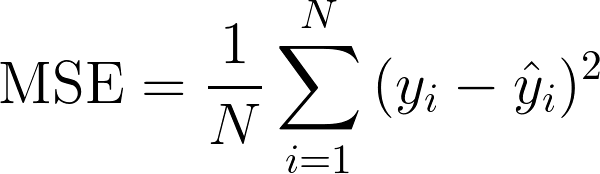

In [77]:
Image(filename="Data/mse.png")

In [78]:
import torch.utils.data

num_workers = 0
# how many samples per batch to load
batch_size = 2
# prepare data loaders
train_loader = torch.utils.data.DataLoader(train_x, batch_size=batch_size, num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_x, batch_size=batch_size, num_workers=num_workers)

Lançons l'entrainement sur 101 Epochs

In [79]:
n_epochs = 101

for epoch in range(1, n_epochs+1):
    # monitor training loss
    train_loss = 0.0
    
    ###################
    # train the model #
    ###################
    for data in train_loader:
        # _ stands in for labels, here
        # no need to flatten images
        images = data.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        outputs = model(images)
        # calculate the loss
        loss = criterion(outputs, images)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update running training loss
        train_loss += loss.item()*images.size(0)
            
    # print avg training statistics 
    train_loss = train_loss/len(train_loader)
    if(epoch % 10 == 1):
        print('Epoch: {} \tTraining Loss: {:.6f}'.format(
            epoch, 
            train_loss
            ))

Epoch: 1 	Training Loss: 0.038455
Epoch: 11 	Training Loss: 0.000008
Epoch: 21 	Training Loss: 0.000006
Epoch: 31 	Training Loss: 0.000002
Epoch: 41 	Training Loss: 0.000001
Epoch: 51 	Training Loss: 0.000001
Epoch: 61 	Training Loss: 0.000001
Epoch: 71 	Training Loss: 0.000001
Epoch: 81 	Training Loss: 0.000000
Epoch: 91 	Training Loss: 0.000000
Epoch: 101 	Training Loss: 0.000000


Passons à la partie test 

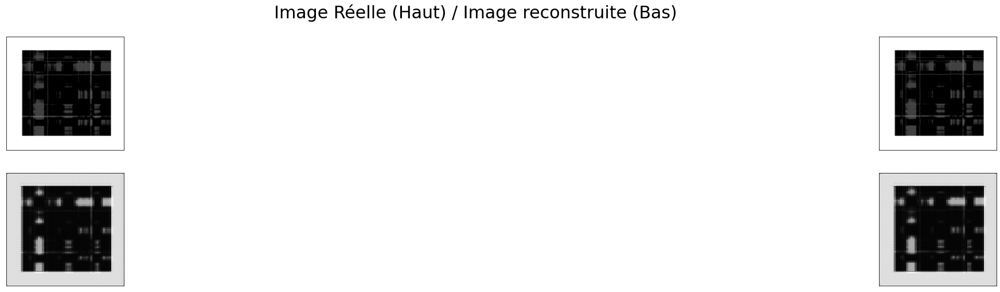

In [81]:
dataiter = iter(test_loader)
images= dataiter.next()
output = model(images.cuda())
# prep images for display
images = images.numpy()

# output is resized into a batch of iages
output = output.view(batch_size, 1, 216, 224)
# use detach when it's an output that requires_grad
output = output.detach().cpu().numpy()


fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(50,8))
fig.suptitle("Image Réelle (Haut) / Image reconstruite (Bas)", fontsize=30)
# input images on top row, reconstructions on bottom
for images, row in zip([images, output], axes):
    for img, ax in zip(images, row):
        ax.imshow(np.squeeze(img[0]), cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        

Visualisons l'erreur de reconstruction sur le test par rapport à la période correspondante

In [82]:
losses = []
images_test = []
for data in test_loader:
        # _ stands in for labels, here
        # no need to flatten images
        images = data.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        outputs = model(images)
        # calculate the loss
        losses.append(criterion(outputs, images).item())
        images_test.append(images.view(batch_size, 1, 216,224).detach().cpu().numpy())

Text(0.5, 1.0, 'Série Temporelle')

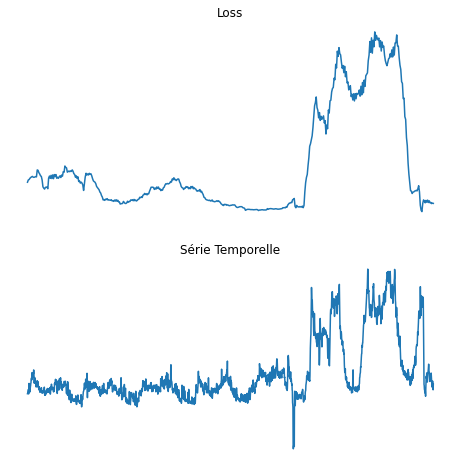

In [95]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(2, 1, 1)
ax.axis('off')
ax.plot(losses)
ax.set_title('Loss')
ax = fig.add_subplot(2, 1, 2)
ax.axis('off')
ax.plot(df_test[2000:-900])
ax.set_title('Série Temporelle')

# Conclusion <a name="Conclusion"></a>

L'auto-encodeur est un modèle puissant qui peut apprendre la texture des images.

Cependant, un point reste à étudier pour produire une approche robuste et entièrement automatisée à partir d'un auto-encodeur.

    - un choix automatique et intelligent du seuil d'anomalie.